In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
from matplotlib import pyplot as plt 
import warnings 
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_pickle('preprocessed_data.pkl')

In [3]:
data

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,10,3,4,...,4,10,2,2,10,7,0,8,No,3
1,47,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,14,4,4,...,4,20,2,3,7,7,1,7,No,3
2,40,Male,Life Sciences,Married,Sales,Sales Executive,Travel_Frequently,5,4,4,...,3,20,2,3,18,13,1,12,No,4
3,41,Male,Human Resources,Divorced,Human Resources,Manager,Travel_Rarely,10,4,2,...,2,23,2,2,21,6,12,6,No,3
4,60,Male,Marketing,Single,Sales,Sales Executive,Travel_Rarely,16,4,1,...,4,10,1,3,2,2,2,2,No,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,27,Female,Medical,Divorced,Sales,Sales Executive,Travel_Frequently,3,1,4,...,2,6,3,3,6,5,0,4,No,4
1196,37,Male,Life Sciences,Single,Development,Senior Developer,Travel_Rarely,10,2,4,...,1,4,2,3,1,0,0,0,No,3
1197,50,Male,Medical,Married,Development,Senior Developer,Travel_Rarely,28,1,4,...,3,20,3,3,20,8,3,8,No,3
1198,34,Female,Medical,Single,Data Science,Data Scientist,Travel_Rarely,9,3,4,...,2,9,3,4,8,7,7,7,No,3


In [4]:
data.columns

Index(['Age', 'Gender', 'EducationBackground', 'MaritalStatus',
       'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency',
       'DistanceFromHome', 'EmpEducationLevel', 'EmpEnvironmentSatisfaction',
       'EmpHourlyRate', 'EmpJobInvolvement', 'EmpJobLevel',
       'EmpJobSatisfaction', 'NumCompaniesWorked', 'OverTime',
       'EmpLastSalaryHikePercent', 'EmpRelationshipSatisfaction',
       'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
       'EmpWorkLifeBalance', 'ExperienceYearsAtThisCompany',
       'ExperienceYearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Attrition', 'PerformanceRating'],
      dtype='object')

### Exploratory data analysis

In [5]:
# Univariate analysis 

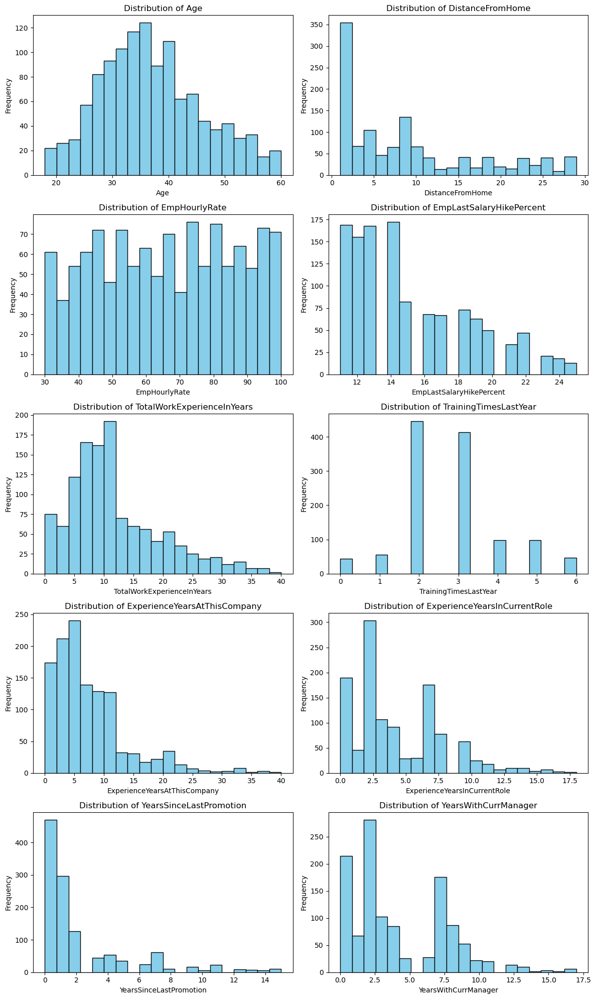

In [6]:
numerical_columns = [
    'Age', 'DistanceFromHome', 'EmpHourlyRate', 'EmpLastSalaryHikePercent',
    'TotalWorkExperienceInYears', 'TrainingTimesLastYear',
    'ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole',
    'YearsSinceLastPromotion', 'YearsWithCurrManager'
]


fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 20))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    axes[i].hist(data[col], bins=20, color='skyblue', edgecolor='black')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

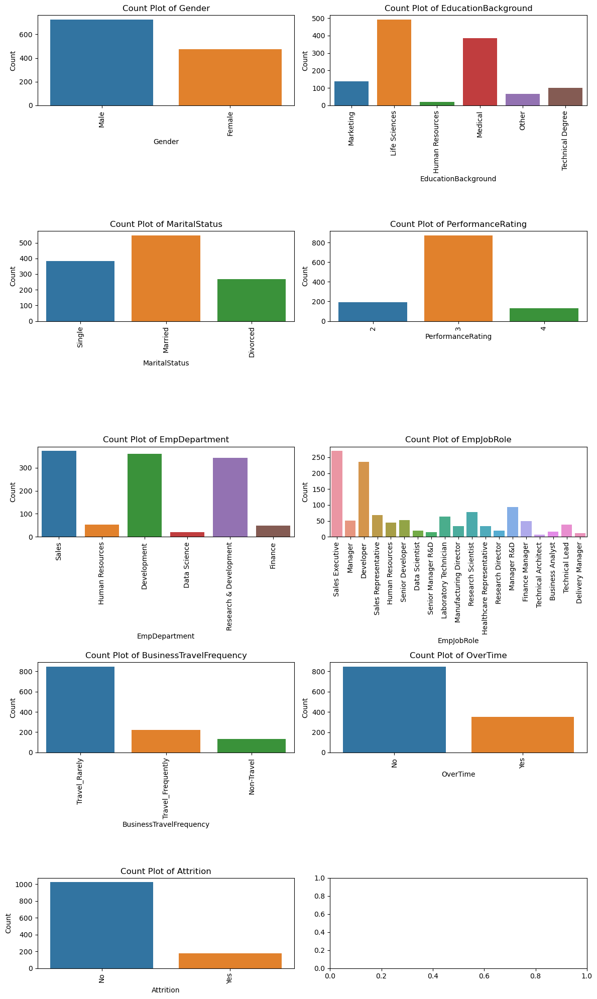

In [7]:
categorical_columns = [
   'Gender', 'EducationBackground', 'MaritalStatus', 'PerformanceRating',
    'EmpDepartment', 'EmpJobRole', 'BusinessTravelFrequency', 'OverTime', 'Attrition'
]

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(12, 20))
axes = axes.flatten()

for i, col in enumerate(categorical_columns):
    sns.countplot(data=data, x=col, ax=axes[i])
    axes[i].set_title(f'Count Plot of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90) 
plt.tight_layout()
plt.show()


In [8]:
# Multi variate analysis 

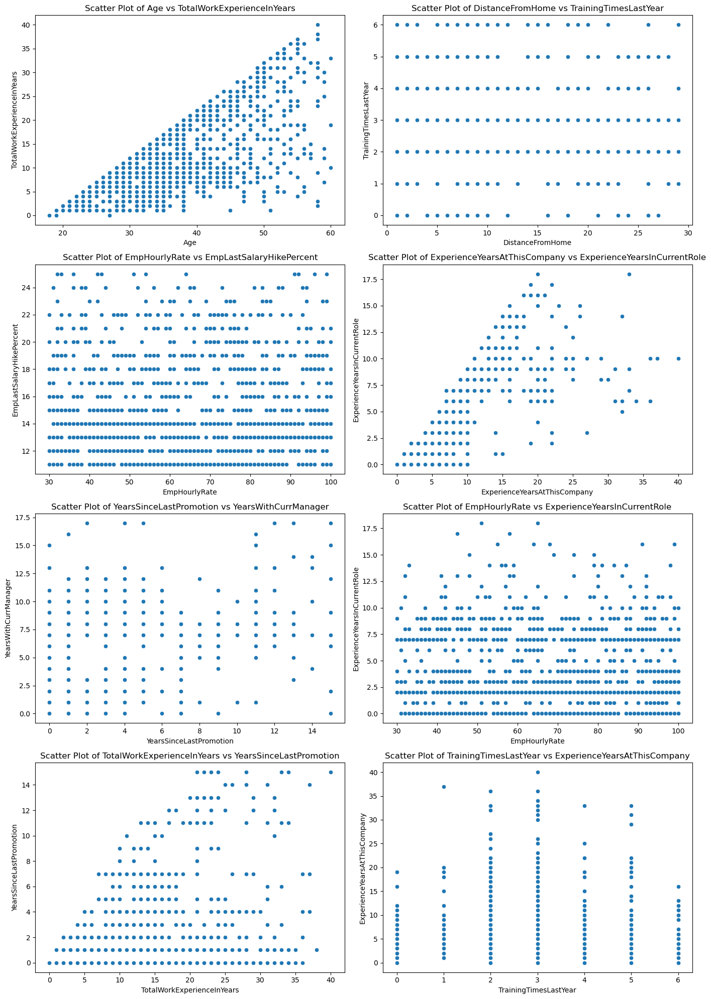

In [9]:
numerical_pairs = [
    ('Age', 'TotalWorkExperienceInYears'),
    ('DistanceFromHome', 'TrainingTimesLastYear'),
    ('EmpHourlyRate', 'EmpLastSalaryHikePercent'),
    ('ExperienceYearsAtThisCompany', 'ExperienceYearsInCurrentRole'),
    ('YearsSinceLastPromotion', 'YearsWithCurrManager'),
    ('EmpHourlyRate', 'ExperienceYearsInCurrentRole'),
    ('TotalWorkExperienceInYears', 'YearsSinceLastPromotion'),
    ('TrainingTimesLastYear', 'ExperienceYearsAtThisCompany')
]

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 20))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(numerical_pairs):
    sns.scatterplot(x=data[x_col], y=data[y_col], ax=axes[i])
    axes[i].set_title(f'Scatter Plot of {x_col} vs {y_col}')
    axes[i].set_xlabel(x_col)
    axes[i].set_ylabel(y_col)

plt.tight_layout()
plt.show()

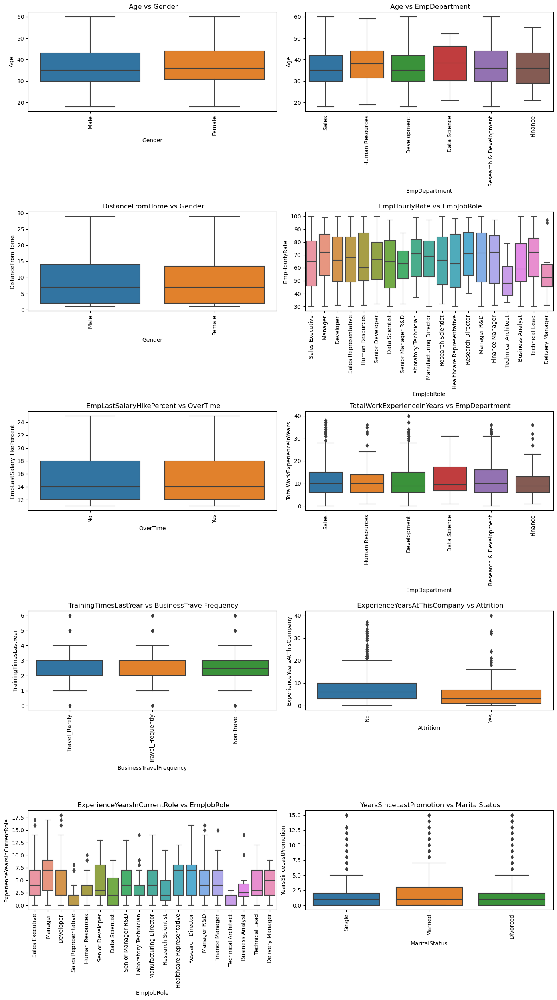

In [10]:
categorical_numerical_pairs = [
    ('Age', 'Gender'),
    ('Age', 'EmpDepartment'),
    ('DistanceFromHome', 'Gender'),
    ('EmpHourlyRate', 'EmpJobRole'),
    ('EmpLastSalaryHikePercent', 'OverTime'),
    ('TotalWorkExperienceInYears', 'EmpDepartment'),
    ('TrainingTimesLastYear', 'BusinessTravelFrequency'),
    ('ExperienceYearsAtThisCompany', 'Attrition'),
    ('ExperienceYearsInCurrentRole', 'EmpJobRole'),
    ('YearsSinceLastPromotion', 'MaritalStatus')
]

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 25))
axes = axes.flatten()

for i, (numerical_col, categorical_col) in enumerate(categorical_numerical_pairs):
    sns.boxplot(x=data[categorical_col], y=data[numerical_col], ax=axes[i])
    axes[i].set_title(f' {numerical_col} vs {categorical_col}')
    axes[i].set_xlabel(categorical_col)
    axes[i].set_ylabel(numerical_col)
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


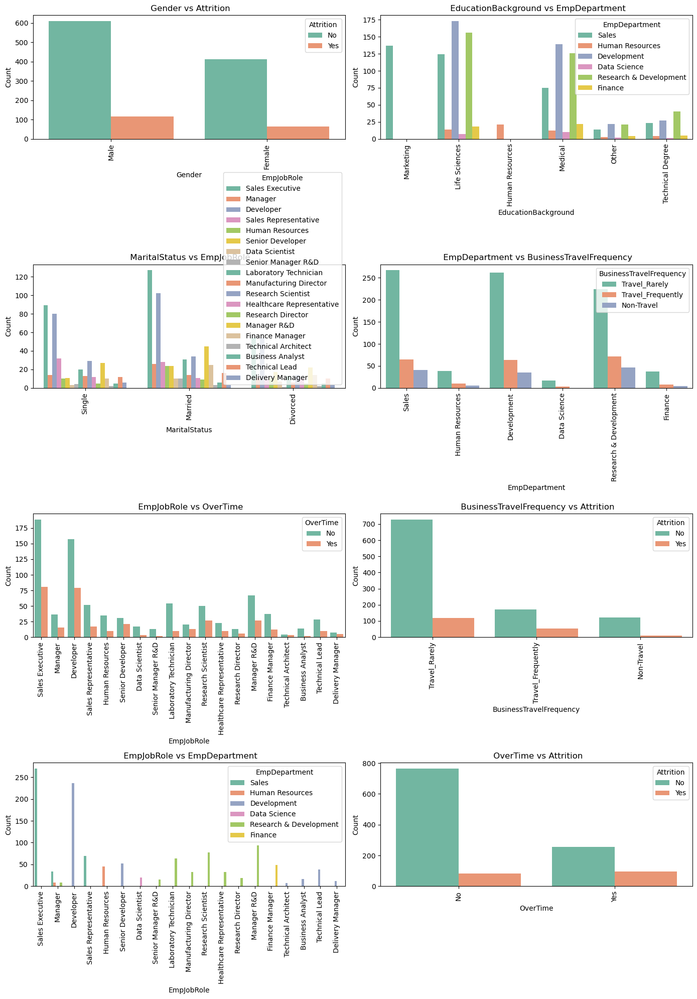

In [11]:
categorical_categorical_pairs = [
    ('Gender', 'Attrition'),
    ('EducationBackground', 'EmpDepartment'),
    ('MaritalStatus', 'EmpJobRole'),
    ('EmpDepartment', 'BusinessTravelFrequency'),
    ('EmpJobRole', 'OverTime'),
    ('BusinessTravelFrequency', 'Attrition'),
    ('EmpJobRole', 'EmpDepartment'),
    ('OverTime', 'Attrition')
]

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 20))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(categorical_categorical_pairs):
    sns.countplot(x=x_col, hue=y_col, data=data, ax=axes[i], palette='Set2')
    axes[i].set_title(f' {x_col} vs {y_col}')
    axes[i].set_xlabel(x_col)
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=90)

# Adjust layout
plt.tight_layout()
plt.show()


In [12]:
# Auto EDA
from ydata_profiling import ProfileReport
!pip install ydata-profiling
profile=ProfileReport(data,title="EDA",explorative=False)
profile

Defaulting to user installation because normal site-packages is not writeable


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
data.to_pickle('Exploratory_data_analysis.pkl')